# 1. Import and Install Dependencies

In [1]:
import cv2
import numpy as np
import os
import time
import datetime
import mediapipe as mp
import datetime
import numpy as np
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.applications import ResNet50V2
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.applications.xception import Xception
from keras.layers import Input, Dense
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Reshape, LSTM, Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from keras.models import Model
from tensorflow.keras.applications import InceptionResNetV2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from tensorflow.keras.layers import LSTM, Reshape
#%matplotlib inline 
import copy
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras import backend as K
from keras.utils.vis_utils import plot_model
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.callbacks import TensorBoard
from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense
from keras import models
from matplotlib import pyplot
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import metrics
from tensorflow.keras.layers import Dropout
from sklearn.metrics import confusion_matrix
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, GlobalMaxPooling2D
from tensorflow.keras.regularizers import l2
import time
from keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50


# 2. Keypoints using MP Holistic

In [2]:
def DrawText(img,sText,x,y):
    font                   = cv2.FONT_HERSHEY_SIMPLEX
    posf = (x,y)
    fontScale              = 5
    fontColor              = (255,255,255)
    thickness              = 1
    lineType               = 2
    print("Masuk")
    cv2.putText(img,sText, 
        posf, 
        font, 
        fontScale,
        fontColor,
        thickness,
        lineType)
    return copy.deepcopy(img)
    

In [3]:
def GetFileName():
        x = datetime.datetime.now()
        s = x.strftime('%Y-%m-%d-%H%M%S%f')
        return s

In [4]:
def CreateDir(path):
    ls = [];
    head_tail = os.path.split(path)
    ls.append(path)
    while len(head_tail[1])>0:
        head_tail = os.path.split(path)
        path = head_tail[0]
        ls.append(path)
        head_tail = os.path.split(path)   
    for i in range(len(ls)-2,-1,-1):
        sf =ls[i]
        isExist = os.path.exists(sf)
        if not isExist:
            os.makedirs(sf)
NamaDataSet = "Kata"

# 3. DRAW LANDMARKS

In [5]:
def draw_landmarks(image, results):
    #mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION) # Draw face connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
    mp_drawing.draw_landmarks(bimage, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections


In [6]:
def draw_styled_landmarks(image, results):
    # Draw face connections
   # mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION, 
                            # mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1), 
                            # mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
                            # ) 
    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             ) 

# 4. Create Dataset

In [7]:
def Dataset(NoKamera,NamaDataSet):
    DirektoriData = "D:\\temp\\contohgambar"+"\\"+NamaDataSet
    #+"\\"+GetFileName()    
    CreateDir(DirektoriData)        
    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_holistic = mp.solutions.holistic
    imsize=(640, 480)
    TimeStart = time.time() 
    TimeNow = time.time() +10
    FrameRate = 10
    
    
    cap = cv2.VideoCapture(NoKamera,cv2.CAP_DSHOW)
    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
      
      while cap.isOpened():
        success, image = cap.read()
        if not success:
          print("Ignoring empty camera frame.")
          # If loading a video, use 'break' instead of 'continue'.
          continue
    

        image.flags.writeable = False                  # Image is no longer writeable
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, imsize)
        results = holistic.process(image)                 # Make prediction
        
        image_height, image_width, _ = image.shape
        
        coords = []
        coordsy = []
      
        if not results.pose_landmarks:
            continue
            
        for A in results.pose_landmarks.landmark:
            
            if (A.x>0.01)and(A.x<1-0.01)and(A.y>0.01)and(A.y<1-0.01):
                cx, cy = A.x * image_width, A.y*image_height 
                coords.append(cx) 
                coordsy.append(cy)
        if len(coords) ==0:
            continue
        elif len(coordsy) ==0:
            continue

        #if results.pose_landmarks:
        #    pose_landmarks = results.pose_landmarks.landmark
        #    for A in pose_landmarks:
        #      cx, cy = A.x * image_width, A.y*image_height                                                                                                                                                                                                                                                                                                                                                                                            
        #      coords.append(cx) 
        #      coordsy.append(cy) 

        x_max = max(coords)
        y_max = max(coordsy)
        x_min = min(coords)
        y_min = min(coordsy)
            

        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (255, 255, 0), 2)

        if (int (x_max) < 0):
            x_max = 1
        elif (int (x_min) < 0):
            x_min = 1
        elif (int (x_max) < 0):
            y_max = 1
        elif (int (x_min) < 0):
            y_min = 1   
            
        image.flags.writeable = True                   # Image is now writeable 
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
        bimage = np.zeros((image_height,image_width,3), np.uint8)
        cv2.rectangle(bimage,(int(x_min), int(y_min)),(int(x_max), int(y_max)),(0,255,0),2) #(KALAU MAU PAKAI BOUNDING BOX)
        
        mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
        mp_drawing.draw_landmarks(bimage, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
      
        
 
              

        image = cv2.rectangle(image,(int(x_min), int(y_min)),(int(x_max), int(y_max)),(255,255,0),2)
        
 
        cropped_image = bimage[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)),:]
        dy =y_max -y_min
        dx = x_max -x_min
        print(dy,dx)
        print(cropped_image.shape) 
        TimeNow = time.time() 
        if TimeNow-TimeStart>1/FrameRate:
            print(cropped_image.shape)
            TimeStart = TimeNow
            sFile = DirektoriData+"\\"+GetFileName()
            imsize2=(128,128)
            cropped_image = cv2.resize(cropped_image, imsize2)
            #cropped_image = cv2.resize(bimage, imsize2)
            cv2.imwrite(sFile+'.jpg', cropped_image)
            #cv2.imwrite(sFile+'.png', image)
        
        cv2.imshow('MediaPipe Pose', cv2.flip(image, 1))
        if cv2.waitKey(10) & 0xFF == ord('q'):
              break
    cap.release()
    cv2.destroyAllWindows()

# 5. Predict Pose

In [8]:
def PredictPose(NoKamera,LabelKelas):
    ModelCNN = load_model('weight_CNN_BARU_Update.h5') 


    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize=(640, 480)

     # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
    (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
    (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
    (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
    (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
    (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    #(mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.LEFT_KNEE),
    #(mp_pose.PoseLandmark.LEFT_KNEE, mp_pose.PoseLandmark.LEFT_ANKLE),
    #(mp_pose.PoseLandmark.RIGHT_HIP, mp_pose.PoseLandmark.RIGHT_KNEE),
    #(mp_pose.PoseLandmark.RIGHT_KNEE, mp_pose.PoseLandmark.RIGHT_ANKLE)
    ]


    # For webcam input:
    cap = cv2.VideoCapture(NoKamera,cv2.CAP_DSHOW)
    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:
      
      while cap.isOpened():
        success, image = cap.read()
        if not success:
          print("Ignoring empty camera frame.")
          # If loading a video, use 'break' instead of 'continue'.
          continue
    

        image.flags.writeable = False                  # Image is no longer writeable
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, imsize)
        results = holistic.process(image)                 # Make prediction
        
        height, width, _ = image.shape
        coords = []
        coordsy = []
                                                                                                                                  

        if not results.pose_landmarks:
                continue
        for A in results.pose_landmarks.landmark:

            if (A.x>0.01)and(A.x<1-0.01)and(A.y>0.01)and(A.y<1-0.01):
                cx, cy = A.x * width, A.y*height 
                coords.append(cx) 
                coordsy.append(cy)
        if len(coords) ==0:
            continue
        if len(coordsy) ==0:
            continue

        x_max = max(coords)
        y_max = max(coordsy)
        x_min = min(coords)
        y_min = min(coordsy)

        
        if (int (x_max) < 0):
            x_max = 1
        elif (int (x_min) < 0):
            x_min = 1
        elif (int (y_max) < 0):
            y_max = 1
        elif (int (y_min) < 0):
            y_min = 1   
        
        image.flags.writeable = True                   # Image is now writeable 
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
        bimage = np.zeros((height,width,3), np.uint8)

        
        mp_drawing.draw_landmarks(
            image,
            results.pose_landmarks,
            UPPER_BODY_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )
        
        
        mp_drawing.draw_landmarks(
            bimage,
            results.pose_landmarks,
            UPPER_BODY_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )
       
        
        idx = Klasifikasi(bimage, ModelCNN)
        x=60
        y=60
        image= cv2.flip(image, 1)
    
        if idx>=0:
            cv2.putText(image,LabelKelas[idx], (x,y), cv2.FONT_HERSHEY_SIMPLEX,2.0, (255, 255, 0), 3)
        

        cv2.imshow('MediaPipe Pose', image)
                
       
        if cv2.waitKey(5) & 0xFF == ord('q'):
              break
    cap.release()
    cv2.destroyAllWindows()

In [9]:
def PredictPose2(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN_Baru_Epoch.h5')
    
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_drawing = mp.solutions.drawing_utils
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize = (640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
    (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
    (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
    (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
    (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
    (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
    (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    #(mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.LEFT_KNEE),
    #(mp_pose.PoseLandmark.LEFT_KNEE, mp_pose.PoseLandmark.LEFT_ANKLE),
    #(mp_pose.PoseLandmark.RIGHT_HIP, mp_pose.PoseLandmark.RIGHT_KNEE),
    #(mp_pose.PoseLandmark.RIGHT_KNEE, mp_pose.PoseLandmark.RIGHT_ANKLE)
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    prediction_results = []  # List to store the pose prediction results

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:

        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)  # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1 - 0.01) and (A.y > 0.01) and (A.y < 1 - 0.01):
                    cx, cy = A.x * width, A.y * height
                    coords.append(cx)
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)
           
            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1

            image.flags.writeable = True  # Image is now writeable
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # COLOR CONVERSION RGB 2 BGR
            bimage = np.zeros((height, width, 3), np.uint8)

            mp_drawing.draw_landmarks(
            image,
            results.pose_landmarks,
            UPPER_BODY_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )
        
        
            mp_drawing.draw_landmarks(
            bimage,
            results.pose_landmarks,
            UPPER_BODY_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )
       

            cropped_image = image[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)), :]
            idx = Klasifikasi(bimage, ModelCNN)
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            if idx >= 0:
                prediction = LabelKelas[idx]
                prediction_results.append(prediction)  # Store the pose prediction result in the array
                cv2.putText(image, prediction, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

            cv2.imshow('MediaPipe Pose', image)

            if cv2.waitKey(5) & 0xFF == ord('q'):
                break

        cap.release()
        cv2.destroyAllWindows()

    # Join all the elements in prediction_results using a delimiter
    joined_results = ' '.join(prediction_results)

    return joined_results


In [10]:
import time

def PredictPose3(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN_Baru_Epoch.h5')
    
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_drawing = mp.solutions.drawing_utils
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize = (640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
        (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
        (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
        (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    prediction_results = []  # List to store the pose prediction results

    start_time = time.time()  # Start time for the 5-second interval
    elapsed_time = 0  # Elapsed time since the last prediction

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:

        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)  # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1 - 0.01) and (A.y > 0.01) and (A.y < 1 - 0.01):
                    cx, cy = A.x * width, A.y * height
                    coords.append(cx)
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)

            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1

            image.flags.writeable = True  # Image is now writeable
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # COLOR CONVERSION RGB 2 BGR
            bimage = np.zeros((height, width, 3), np.uint8)

            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            mp_drawing.draw_landmarks(
                bimage,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            cropped_image = image[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)), :]
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            current_time = time.time()
            elapsed_time = current_time - start_time

            if elapsed_time >= 8:  # Perform prediction every 5 seconds
                idx = Klasifikasi(bimage, ModelCNN)

                if idx >= 0:
                    prediction = LabelKelas[idx]
                    prediction_results.append(prediction)  # Store the pose prediction result in the array
                    cv2.putText(image, prediction, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

                start_time = time.time()  # Reset the start time for the next 5-second interval

            # Display the timer on the screen
            timer_text = f"Timer: {int(elapsed_time)}s"
            cv2.putText(image, timer_text, (10, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 0), 2)

            cv2.imshow('MediaPipe Pose', image)

            if cv2.waitKey(5) & 0xFF == ord('q'):
                break

        cap.release()
        cv2.destroyAllWindows()

    # Join all the elements in prediction_results using a delimiter
    joined_results = ' '.join(prediction_results)

    return joined_results


In [11]:
import time

def PredictPose4(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN_Baru_Epoch.h5')
    
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_drawing = mp.solutions.drawing_utils
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize = (640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
        (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
        (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
        (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    prediction_results = []  # List to store the pose prediction results

    start_time = time.time()  # Start time for the 8-second interval
    elapsed_time = 0  # Elapsed time since the last prediction

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:

        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)  # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1 - 0.01) and (A.y > 0.01) and (A.y < 1 - 0.01):
                    cx, cy = A.x * width, A.y * height
                    coords.append(cx)
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)

            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1

            image.flags.writeable = True  # Image is now writeable
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # COLOR CONVERSION RGB 2 BGR
            bimage = np.zeros((height, width, 3), np.uint8)

            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            mp_drawing.draw_landmarks(
                bimage,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            cropped_image = image[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)), :]
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            current_time = time.time()
            elapsed_time = current_time - start_time

            if elapsed_time >= 8:  # Perform prediction every 8 seconds
                idx = Klasifikasi(bimage, ModelCNN)

                if idx >= 0:
                    prediction = LabelKelas[idx]
                    prediction_results.append(prediction)  # Store the pose prediction result in the array
                    cv2.putText(image, prediction, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

                start_time = time.time()  # Reset the start time for the next 8-second interval

            # Display the timer on the screen
            timer_text = f"Timer: {int(elapsed_time)}s"
            cv2.putText(image, timer_text, (10, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

            # Show joined results on the video
            joined_results = ' '.join(prediction_results)
            cv2.putText(image, 'Results: ' + joined_results, (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 165, 255), 2)


            cv2.imshow('MediaPipe Pose', image)

            if cv2.waitKey(5) & 0xFF == ord('q'):
                break

        cap.release()
        cv2.destroyAllWindows()

    # Join all the elements in prediction_results using a delimiter
    joined_results = ' '.join(prediction_results)

    return joined_results



In [12]:
import time

def PredictPose5(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN3_baru.h5')
    
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_drawing = mp.solutions.drawing_utils
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize = (640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
        (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
        (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
        (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    prediction_results = []  # List to store the pose prediction results

    start_time = time.time()  # Start time for the 8-second interval
    elapsed_time = 0  # Elapsed time since the last prediction

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:

        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)  # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1 - 0.01) and (A.y > 0.01) and (A.y < 1 - 0.01):
                    cx, cy = A.x * width, A.y * height
                    coords.append(cx)
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)

            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1

            image.flags.writeable = True  # Image is now writeable
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # COLOR CONVERSION RGB 2 BGR
            bimage = np.zeros((height, width, 3), np.uint8)

            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            mp_drawing.draw_landmarks(
                bimage,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            cropped_image = image[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)), :]
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            current_time = time.time()
            elapsed_time = current_time - start_time

            if elapsed_time >= 8:  # Perform prediction every 8 seconds
                idx = Klasifikasi(bimage, ModelCNN)

                if idx >= 0:
                    prediction = LabelKelas[idx]
                    prediction_results.append(prediction)  # Store the pose prediction result in the array
                    cv2.putText(image, prediction, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

                start_time = time.time()  # Reset the start time for the next 8-second interval

            # Display the timer on the screen
            timer_text = f"Timer: {int(elapsed_time)}s"
            cv2.putText(image, timer_text, (10, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

            # Show joined results on the video
            joined_results = ' '.join(prediction_results)
            cv2.putText(image, 'Results: ' + joined_results, (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 165, 255), 2)

            cv2.imshow('MediaPipe Pose', image)

            key = cv2.waitKey(5) & 0xFF
            if key == ord('q'):
                break
            elif key == ord('c'):
                prediction_results = []  # Clear the prediction results array

        cap.release()
        cv2.destroyAllWindows()

    # Join all the elements in prediction_results using a delimiter
    joined_results = ' '.join(prediction_results)

    return joined_results


In [13]:
import time

def PredictPose6(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN3_baru.h5') 

    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize=(640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
        (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
        (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
        (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:
      
        # Variables for frame rate calculation
        start_time = time.time()
      
        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False                  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)                 # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1-0.01) and (A.y > 0.01) and (A.y < 1-0.01):
                    cx, cy = A.x * width, A.y*height 
                    coords.append(cx) 
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)

            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1   

            image.flags.writeable = True                   # Image is now writeable 
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
            bimage = np.zeros((height,width,3), np.uint8)

            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            mp_drawing.draw_landmarks(
                bimage,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            idx = Klasifikasi(bimage, ModelCNN)
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            if idx >= 0:
                cv2.putText(image, LabelKelas[idx], (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

            # Calculate elapsed time and frame rate
            elapsed_time = time.time() - start_time
            fps = 1 / elapsed_time if elapsed_time > 0 else 0

            # Print frame rate
            print("FPS: {:.2f}".format(fps))

            # Update start time for the next iteration
            start_time = time.time()

            cv2.imshow('MediaPipe Pose', image)

            if cv2.waitKey(5) & 0xFF == ord('q'):
                break
        cap.release()
        cv2.destroyAllWindows()


In [14]:
import time

def PredictPose7(NoKamera, LabelKelas):
    ModelCNN = load_model('weight_CNN_BARU_Update.h5')
    
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_drawing = mp.solutions.drawing_utils
    mp_holistic = mp.solutions.holistic
    mp_pose = mp.solutions.pose
    imsize = (640, 480)

    # Define the upper body connections
    UPPER_BODY_CONNECTIONS = [
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_ELBOW),
        (mp_pose.PoseLandmark.LEFT_ELBOW, mp_pose.PoseLandmark.LEFT_WRIST),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_ELBOW),
        (mp_pose.PoseLandmark.RIGHT_ELBOW, mp_pose.PoseLandmark.RIGHT_WRIST),
        (mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.LEFT_HIP),
        (mp_pose.PoseLandmark.RIGHT_SHOULDER, mp_pose.PoseLandmark.RIGHT_HIP),
        (mp_pose.PoseLandmark.LEFT_HIP, mp_pose.PoseLandmark.RIGHT_HIP),
    ]

    # For webcam input:
    cap = cv2.VideoCapture(NoKamera, cv2.CAP_DSHOW)
    prediction_results = []  # List to store the pose prediction results

    start_time = time.time()  # Start time for the 8-second interval
    elapsed_time = 0  # Elapsed time since the last prediction

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5) as holistic:

        while cap.isOpened():
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                continue

            image.flags.writeable = False  # Image is no longer writeable
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, imsize)
            results = holistic.process(image)  # Make prediction

            height, width, _ = image.shape
            coords = []
            coordsy = []

            if not results.pose_landmarks:
                continue
            for A in results.pose_landmarks.landmark:
                if (A.x > 0.01) and (A.x < 1 - 0.01) and (A.y > 0.01) and (A.y < 1 - 0.01):
                    cx, cy = A.x * width, A.y * height
                    coords.append(cx)
                    coordsy.append(cy)
            if len(coords) == 0:
                continue
            if len(coordsy) == 0:
                continue

            x_max = max(coords)
            y_max = max(coordsy)
            x_min = min(coords)
            y_min = min(coordsy)

            if (int(x_max) < 0):
                x_max = 1
            elif (int(x_min) < 0):
                x_min = 1
            elif (int(y_max) < 0):
                y_max = 1
            elif (int(y_min) < 0):
                y_min = 1

            image.flags.writeable = True  # Image is now writeable
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # COLOR CONVERSION RGB 2 BGR
            bimage = np.zeros((height, width, 3), np.uint8)

            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            mp_drawing.draw_landmarks(
                bimage,
                results.pose_landmarks,
                UPPER_BODY_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style(),
            )

            cropped_image = image[(int(y_min)):(int(y_max)), (int(x_min)):(int(x_max)), :]
            x = 60
            y = 60
            image = cv2.flip(image, 1)

            current_time = time.time()
            elapsed_time = current_time - start_time

            if elapsed_time >= 8:  # Perform prediction every 8 seconds
                idx = Klasifikasi(bimage, ModelCNN)

                if idx >= 0:
                    prediction = LabelKelas[idx]
                    if prediction == "Akhir":
                        prediction_results = []  # Clear the prediction results array if pose prediction is "Akhir"
                    else:
                        prediction_results.append(prediction)  # Store the pose prediction result in the array
                        cv2.putText(image, prediction, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 0), 3)

                start_time = time.time()  # Reset the start time for the next 8-second interval

            # Display the timer on the screen
            timer_text = f"Timer: {int(elapsed_time)}s"
            cv2.putText(image, timer_text, (10, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

            # Show joined results on the video
            joined_results = ' '.join(prediction_results)
            cv2.putText(image, 'Results: ' + joined_results, (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 165, 255), 2)

            cv2.imshow('MediaPipe Pose', image)

            key = cv2.waitKey(5) & 0xFF
            if key == ord('q'):
                break
            elif key == ord('c'):
                prediction_results = []  # Clear the prediction results array

        cap.release()
        cv2.destroyAllWindows()

    # Join all the elements in prediction_results using a delimiter
    joined_results = ' '.join(prediction_results)

    return joined_results

# 5. Klasifikasi 

In [15]:
def Klasifikasi(Image,ModelCNN):

  X=[]
  ls = [];

  img= copy.deepcopy(Image)
  img=cv2.resize(img,(128,128))
  img= np.asarray(img)/255
  img=img.astype('float32')
  X.append(img)  
  X=np.array(X)
  X=X.astype('float32')
  hs=ModelCNN.predict(X,verbose=0)

  if hs.max()>0.5:
      idx = np.max(np.where( hs == hs.max()))
  else:
    idx=-1
      
 
  return idx

 # 6. Model CNN

In [16]:
def ModelCNN(JumlahKelas):
    input_img = Input(shape=(128, 128, 3)) 

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)  
    x = MaxPooling2D((2, 2), padding='same')(x)   
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)   
    x = MaxPooling2D((2, 2), padding='same')(x)   
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Flatten()(x)
    x = Dense(16,activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16,activation='relu')(x)
    x = Dense(JumlahKelas,activation='softmax')(x)
    ModelCNN = Model(input_img, x)  
    ModelCNN.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    return ModelCNN


In [17]:
def ModelCNN2(JumlahKelas):
    input_img = Input(shape=(128, 128, 3))

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)#,,
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu', kernel_regularizer=l2(0.01))(x)
#    x = Dropout(0.5)(x)
    x = Dense(JumlahKelas,activation='softmax')(x)
    ModelCNN2 = Model(input_img, x)
    ModelCNN2.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
    #ModelCNN.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    #sparse_categorical_crossentropy
    #categorical_crossentropy
    #plot_model(ModelCNN, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
    return ModelCNN2

In [18]:
def ModelCNNResNetV2(JumlahKelas):
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(100, activation='relu')(x)
    x = Dense(50, activation='relu')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    ModelCNNResNetV2 = Model(base_model.input, x)
    ModelCNNResNetV2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return ModelCNNResNetV2

In [19]:
def ModifiedModelCNNVGG16(JumlahKelas):
    # Load the VGG16 model from Keras, excluding the top layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    # Freeze the layers in the base model
    for layer in base_model.layers:
        layer.trainable = False

    # Add new top layers
    x = base_model.output
    x = GlobalMaxPooling2D()(x)  # Add GlobalMaxPooling2D layer
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    # Define the new model
    ModifiedModelCNNVGG16 = Model(inputs=base_model.input, outputs=x)

    # Compile the model
    ModifiedModelCNNVGG16.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])

    return ModifiedModelCNNVGG16

In [20]:
def ModelVGG16(JumlahKelas):
    input_shape = (128, 128, 3)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=x)
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    return model

In [21]:
def ModelVGG19(JumlahKelas):
    base_model = VGG19(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    ModelVGG19 = Model(inputs=base_model.input, outputs=x)
    ModelVGG19.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    return ModelVGG19

In [22]:
def ModifiedModelCNNResNetV2(JumlahKelas):
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    x = base_model.output
    x = Flatten()(x)
    x = Dense(16,activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(56,activation='relu')(x)
    x = Dense(JumlahKelas,activation='softmax')(x)

    ModifiedModelCNNResNetV2 = Model(base_model.input, x)
    ModifiedModelCNNResNetV2.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return ModifiedModelCNNResNetV2

In [23]:
def Modified2ModelCNNResNetV2(JumlahKelas):
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(100, activation='relu')(x)
    x = Dense(50, activation='sigmoid')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    Modified2ModelCNNResNetV2 = Model(base_model.input, x)
    Modified2ModelCNNResNetV2.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return Modified2ModelCNNResNetV2

In [24]:
def ModelCNN3(JumlahKelas):
    input_img = Input(shape=(128, 128, 3))

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)#,,
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu', kernel_regularizer=l2(0.01))(x)
#    x = Dropout(0.5)(x)
    x = Dense(JumlahKelas,activation='softmax')(x)
    ModelCNN3 = Model(input_img, x)
    ModelCNN3.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
    #ModelCNN.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    #sparse_categorical_crossentropy
    #categorical_crossentropy
    #plot_model(ModelCNN, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
    return ModelCNN3

In [25]:
def ModelCNNXception(JumlahKelas):
    input_img = Input(shape=(128, 128, 3)) 

    # Load the Xception model pre-trained on ImageNet
    base_model = Xception(include_top=False, weights='imagenet', input_tensor=input_img)

    # Freeze the layers of the pre-trained model
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(16,activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16,activation='relu')(x)
    x = Dense(JumlahKelas,activation='softmax')(x)

    ModelCNNXception = Model(input_img, x)
    ModelCNNXception.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    return ModelCNNXception

In [26]:
def ModelCNNResNet50V2(JumlahKelas):
    base_model = ResNet50V2(include_top=False, weights='imagenet', input_shape=(128, 128, 3))
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dense(JumlahKelas, activation='softmax')(x)

    ModelCNNResNet50V2 = Model(inputs=base_model.input, outputs=x)
    ModelCNNResNet50V2.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    return ModelCNNResNet50V2

In [27]:
def ModelCNNResNet50(JumlahKelas):
    input_img = Input(shape=(128, 128, 3))
    
    # Load the ResNet50 model (excluding the top layer)
    resnet_model = ResNet50(include_top=False, weights='imagenet', input_tensor=input_img, pooling='avg')
    
    # Freeze the weights of the ResNet50 model
    resnet_model.trainable = False
    
    x = resnet_model.output
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dense(JumlahKelas, activation='softmax')(x)
    
    ModelCNNResNet50 = Model(inputs=input_img, outputs=x)
    ModelCNNResNet50.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    
    return ModelCNNResNet50

 # 7. Load Citra Training

In [28]:
def LoadCitraTraining(sDir,LabelKelas):
  
  JumlahKelas=len(LabelKelas)
  TargetKelas = np.eye(JumlahKelas)
  
  # Menyiapkan variabel list untuk data menampung citra dan data target
  X=[]#Menampung Data Citra
  T=[]#Menampung Target
  for i in range(len(LabelKelas)):    
    #Membaca file citra di setiap direktori data set  
    DirKelas = os.path.join(sDir, LabelKelas[i])
    files = os.listdir(DirKelas)
    
    for f in files:
      ff=f.lower()  
      print(f)
      #memilih citra dengan extensi jpg,jpeg,dan png
      if (ff.endswith('.jpg')):
         NmFile = os.path.join(DirKelas,f)
         #membaca citra berwarna sebagai data bertipe double 
         img= np.double(cv2.imread(NmFile,1))
         img=cv2.resize(img,(128,128));
         #Normalisasi data citra menjadi sehingga maksimum menjadi 1
         img= np.asarray(img)/255;
         img=img.astype('float32')
         #Menambahkan citra dan target ke daftar
         X.append(img)
         T.append(TargetKelas[i])
     #--------akhir loop :Pfor f in files-----------------
  #-----akhir  loop :for i in range(len(LabelKelas))----
  
  #Mengubah List Menjadi numppy array
  X=np.array(X)
  T=np.array(T)
  X=X.astype('float32')
  T=T.astype('float32')
  return X,T


In [29]:
def TrainCNNLSTM(DirektoriDataSet, LabelKelas, DirektoriValidasi, NamaFileBobot ='weight_CNN_BARU_Update_Epoch20.h5' ):#
    #tf.config.experimental_run_functions_eagerly(True)
    #tf.data.experimental.enable_debug_mode()
    #Membaca Data training dan label Kelas
    X,D=LoadCitraTraining(DirektoriDataSet,LabelKelas)
    JumlahKelas = len(LabelKelas)
    #Membuat Model CNN
    ModelCNNlstm = ModelCNN(JumlahKelas)
    # Membaca Data validasi dan label Kelas
    X_val, D_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)
    #Trainng
    history = ModelCNNlstm.fit(X, D,epochs=20, validation_data= (X_val, D_val)) #(validation_data=X_val, D_val validation_split= 0.3)
    #validation_split = 0.5
    #Menyimpan hasil learning
    ModelCNNlstm.save(NamaFileBobot)
    #Mengembalikan output
    return ModelCNNlstm,history

In [30]:
def TrainCNNLSTM2(DirektoriDataSet, LabelKelas, DirektoriValidasi, NamaFileBobot ='weight_CNN_BARU2_Update_Epoch20.h5' ):#
    #tf.config.experimental_run_functions_eagerly(True)
    #tf.data.experimental.enable_debug_mode()
    #Membaca Data training dan label Kelas
    X,D=LoadCitraTraining(DirektoriDataSet,LabelKelas)
    JumlahKelas = len(LabelKelas)
    #Membuat Model CNN
    ModelCNNlstm = ModelCNN2(JumlahKelas)
    # Membaca Data validasi dan label Kelas
    X_val, D_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)
    #Trainng
    history = ModelCNNlstm.fit(X, D,epochs=20, validation_data= (X_val, D_val)) #(validation_data=X_val, D_val validation_split= 0.3)
    #validation_split = 0.5
    #Menyimpan hasil learning
    ModelCNNlstm.save(NamaFileBobot)
    #Mengembalikan output
    return ModelCNNlstm,history

In [31]:
def TrainCNNLSTM3(DirektoriDataSet, LabelKelas, DirektoriValidasi, NamaFileBobot ='weight_CNNResNet50V2_BARU_Update_Epoch20.h5' ):#
    #tf.config.experimental_run_functions_eagerly(True)
    #tf.data.experimental.enable_debug_mode()
    #Membaca Data training dan label Kelas
    X,D=LoadCitraTraining(DirektoriDataSet,LabelKelas)
    JumlahKelas = len(LabelKelas)
    #Membuat Model CNN
    ModelCNNlstm = ModelCNNResNet50V2(JumlahKelas)
    # Membaca Data validasi dan label Kelas
    X_val, D_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)
    #Trainng
    history = ModelCNNlstm.fit(X, D,epochs=20, validation_data= (X_val, D_val)) #(validation_data=X_val, D_val validation_split= 0.3)
    #validation_split = 0.5
    #Menyimpan hasil learning
    ModelCNNlstm.save(NamaFileBobot)
    #Mengembalikan output
    return ModelCNNlstm,history

In [32]:
def TrainCNNLSTM4(DirektoriDataSet, LabelKelas, DirektoriValidasi, NamaFileBobot ='weight_CNNXception_BARU_Update_Epoch20.h5' ):#
    #tf.config.experimental_run_functions_eagerly(True)
    #tf.data.experimental.enable_debug_mode()
    #Membaca Data training dan label Kelas
    X,D=LoadCitraTraining(DirektoriDataSet,LabelKelas)
    JumlahKelas = len(LabelKelas)
    #Membuat Model CNN
    ModelCNNlstm = ModelCNNXception(JumlahKelas)
    # Membaca Data validasi dan label Kelas
    X_val, D_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)
    #Trainng
    history = ModelCNNlstm.fit(X, D,epochs=20, validation_data= (X_val, D_val)) #(validation_data=X_val, D_val validation_split= 0.3)
    #validation_split = 0.5
    #Menyimpan hasil learning
    ModelCNNlstm.save(NamaFileBobot)
    #Mengembalikan output
    return ModelCNNlstm,history

In [33]:
def TrainCNNLSTM5(DirektoriDataSet, LabelKelas, DirektoriValidasi, NamaFileBobot ='weight_CNNResNet50V2_BARU_Update.h5' ):#
    #tf.config.experimental_run_functions_eagerly(True)
    #tf.data.experimental.enable_debug_mode()
    #Membaca Data training dan label Kelas
    X,D=LoadCitraTraining(DirektoriDataSet,LabelKelas)
    JumlahKelas = len(LabelKelas)
    #Membuat Model CNN
    ModelCNNlstm = ModelCNNResNet50V2(JumlahKelas)
    # Membaca Data validasi dan label Kelas
    X_val, D_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)
    #Trainng
    history = ModelCNNlstm.fit(X, D,epochs=30, validation_data= (X_val, D_val)) #(validation_data=X_val, D_val validation_split= 0.3)
    #validation_split = 0.5
    #Menyimpan hasil learning
    ModelCNNlstm.save(NamaFileBobot)
    #Mengembalikan output
    return ModelCNNlstm,history

In [34]:
def TesPosePrediction(DirDataSet,DirKlasifikasi,LabelKelas,ModelCNN=[]):
#Apabila parameter input ModelCNN tidak di isi maka
#   akan menggunakan bobot pada file 'weight.h5
  if not(ModelCNN):
      ModelCNN = load_model('weight4_baru.h5') 
      
#Menyiapkan Data input Yang akan di kasifikasikan
  X=[]
  ls = [];
  DirKelas = DirDataSet+"\\"+DirKlasifikasi
  print(DirKelas)
  files = os.listdir(DirKelas)
  n=0;
  for f in files:
      ff=f.lower()  
      print(f)
      if (ff.endswith('.jpg')):
         ls.append(ff) 
         NmFile = os.path.join(DirKelas,f)
         img= cv2.imread(NmFile,1)
         img=cv2.resize(img,(128,128))
         img= np.asarray(img)/255
         img=img.astype('float32')
         X.append(img)
     #----Akhir if-------------
  #---Akhir For 
  X=np.array(X)
  X=X.astype('float32')
  #Melakukan prediksi Klasifikasi
  hs=ModelCNN.predict(X)
  
  LKlasifikasi=[];
  LKelasCitra =[];
  n = X.shape[0]
  for i in range(n):
      v=hs[i,:]
      if v.max()>0.5:
          idx = np.max(np.where( v == v.max()))
          LKelasCitra.append(LabelKelas[idx])
      else:
          idx=-1
          LKelasCitra.append("-")
      #------akhir if
      LKlasifikasi.append(idx);
  #----akhir for
  LKlasifikasi = np.array(LKlasifikasi)
  return ls, hs, LKelasCitra

In [ ]:
LabelKelas=["A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]
DirektoriDataSet="D:\\temp\\trainingdataset4"

DirKlasifikasi="C"
Res = TesPosePrediction(DirektoriDataSet,DirKlasifikasi,LabelKelas)
print(Res[0])
print(Res[1])

In [40]:
LabelKelas=["A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]

PredictPose7(0,LabelKelas)

'O S'

# Training Pertama : Model CNN

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelCNN,history = TrainCNNLSTM(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelCNN.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelCNN.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Training CNN ResNet50

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelCNNResNet50,history = TrainCNNLSTM3(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelCNNResNet50.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelCNNResNet50.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()


## Training Ketiga : Model CNN Xception

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelCNNXception,history = TrainCNNLSTM4(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelCNNXception.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelCNNXception.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Training Kedua : Model ResNet50V2

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelCNNResNet50V2,history = TrainCNNLSTM3(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelCNNResNet50V2.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelCNNResNet50V2.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Training Keempat Model CNN2

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelCNN2,history = TrainCNNLSTM2(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelCNN2.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelCNN2.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Training Model CNN VGG16

In [ ]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


#d. training
ModelVGG16,history = TrainCNNLSTM4(DirektoriDataSet,LabelKelas , DirektoriValidasi)#
ModelVGG16.summary()

#c. Menampilkan Grafik Loss dan accuracy
plt.plot(history.history['loss'])

plt.title('model loss')
plt.ylabel('loss/accuracy')
plt.xlabel('epoch')
plt.show()

# Print the loss
print("Loss:")
for epoch, loss_value in enumerate(history.history['loss'], 1):
    print(f"Epoch: {epoch}, Loss: {loss_value}")

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('categorical_accuracy')
plt.legend(['train','test'])
plt.show()

# Print the accuracy and validation accuracy
print("Accuracy and Validation Accuracy:")
for epoch, acc, val_acc in zip(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], history.history['val_accuracy']):
    print(f"Epoch: {epoch}, Accuracy: {acc}, Validation Accuracy: {val_acc}")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = ModelVGG16.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Perbandingan Grafik Hasil Akurasi

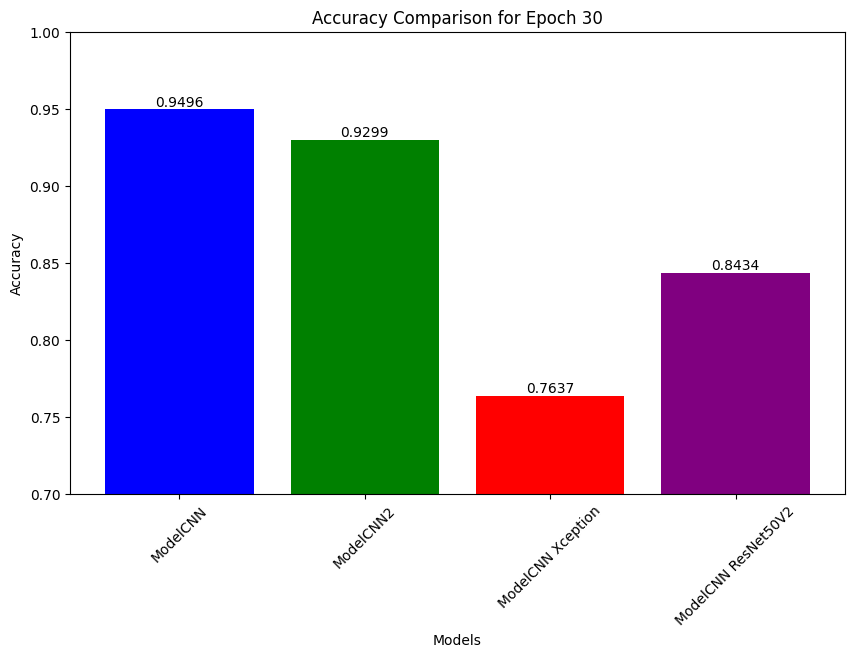

In [8]:
model_names = ['ModelCNN', 'ModelCNN2', 'ModelCNN Xception', 'ModelCNN ResNet50V2']
accuracy_values = [0.949571430683136, 0.9298571348190308, 0.7636666893959045, 0.8434285521507263]
validation_accuracy_values = [0.9673076868057251, 0.9798076748847961, 0.8217307925224304, 0.9551923274993896]

# Assign colors to each model
colors = ['blue', 'green', 'red', 'purple']

# Create bar plot for Accuracy
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, accuracy_values, color=colors)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison for Epoch 30')
plt.ylim([0.7, 1.0])
plt.xticks(rotation=45)

# Add accuracy values on top of each bar
for bar, accuracy in zip(bars, accuracy_values):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{accuracy:.4f}', ha='center', va='bottom')

plt.show()

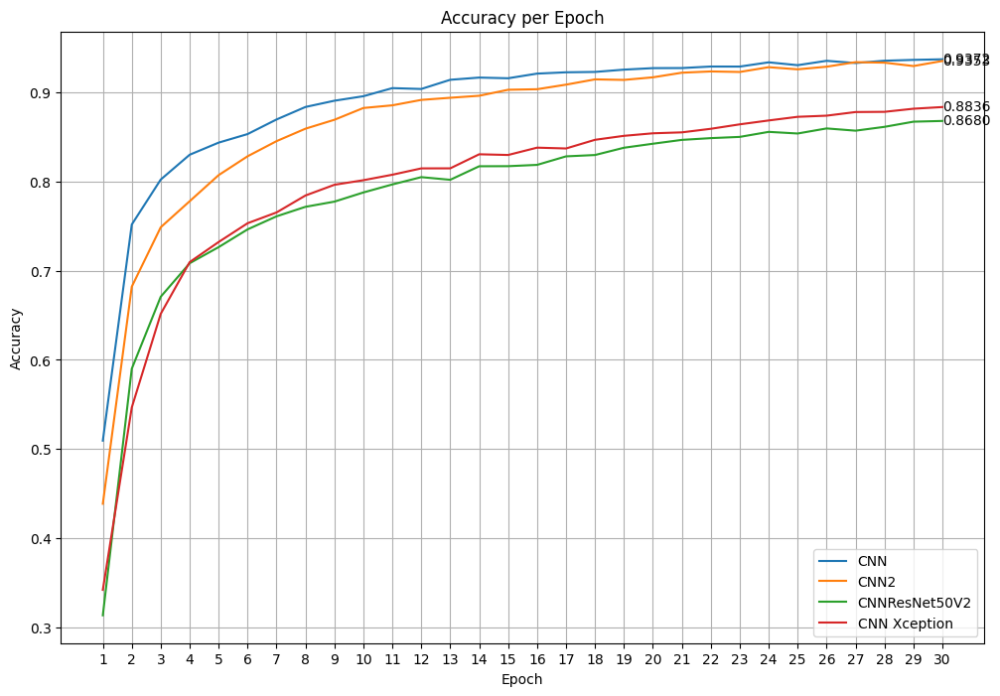

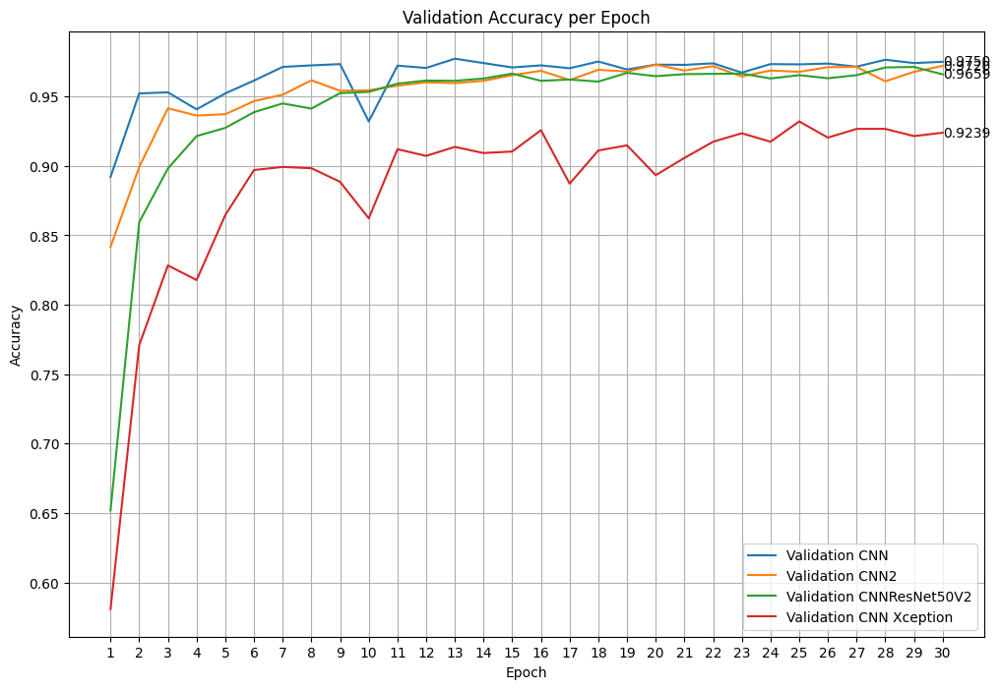

In [49]:
import matplotlib.pyplot as plt

# Data
epochs = range(1, 31)

# Model CNN
accuracy_cnn = [0.5093578100204468, 0.7518348693847656, 0.802293598651886, 0.8301376104354858, 0.8437156081199646,
                0.8533027768135071, 0.8696789145469666, 0.8837155699729919, 0.8907339572906494, 0.8957797884941101,
                0.9048624038696289, 0.903899073600769, 0.9142201542854309, 0.9166972637176514, 0.9159174561500549,
                0.921146810054779, 0.9226146936416626, 0.923027515411377, 0.9255963563919067, 0.927293598651886,
                0.9273853302001953, 0.9290825724601746, 0.9290366768836975, 0.9338073134422302, 0.9305963516235352,
                0.9355046153068542, 0.9330275058746338, 0.9355963468551636, 0.9365596175193787, 0.9372018575668335]

val_accuracy_cnn = [0.892037034034729, 0.9522222280502319, 0.9529629349708557, 0.9407407641410828, 0.9522222280502319,
                    0.9614814519882202, 0.9712963104248047, 0.9724074006080627, 0.9733333587646484, 0.9320370554924011,
                    0.9722222089767456, 0.9705555438995361, 0.977222204208374, 0.9740740656852722, 0.9709259271621704,
                    0.9724074006080627, 0.970370352268219, 0.9751851558685303, 0.9694444537162781, 0.9729629755020142,
                    0.972777783870697, 0.9738888740539551, 0.9672222137451172, 0.9733333587646484, 0.9731481671333313,
                    0.9737036824226379, 0.9714815020561218, 0.9764814972877502, 0.9740740656852722, 0.9750000238418579]

# Model CNN2
accuracy_cnn2 = [0.43853211402893066, 0.682110071182251, 0.7487614750862122, 0.7779816389083862, 0.8072476983070374,
                 0.8283944725990295, 0.8453669548034668, 0.8593577742576599, 0.8693578243255615, 0.8825688362121582,
                 0.8855504393577576, 0.8916513919830322, 0.8940367102622986, 0.8962844014167786, 0.9030275344848633,
                 0.9036238789558411, 0.9087614417076111, 0.9146788716316223, 0.9140825867652893, 0.9169724583625793,
                 0.9221559762954712, 0.9235779643058777, 0.9229816794395447, 0.9283486008644104, 0.925963282585144,
                 0.9288991093635559, 0.9339908361434937, 0.9334403872489929, 0.9296330213546753, 0.9353210926055908]

val_accuracy_cnn2 = [0.8416666388511658, 0.8992592692375183, 0.9414814710617065, 0.936296284198761, 0.9372222423553467,
                     0.9466666579246521, 0.9512962698936462, 0.9616666436195374, 0.9540740847587585, 0.9544444680213928,
                     0.9577777981758118, 0.960185170173645, 0.9596296548843384, 0.9612963199615479, 0.9653703570365906,
                     0.9685184955596924, 0.9618518352508545, 0.9692592620849609, 0.9679629802703857, 0.9729629755020142,
                     0.9687036871910095, 0.9718518257141113, 0.9644444584846497, 0.9687036871910095, 0.9677777886390686,
                     0.9711111187934875, 0.9712963104248047, 0.9609259366989136, 0.9677777886390686, 0.9720370173454285]

# Model CNNResNet50V2
accuracy_resnet50v2 = [0.3133944869041443, 0.5900458693504333, 0.6708256602287292, 0.708394467830658, 0.7264679074287415,
                       0.7463761568069458, 0.761009156703949, 0.7716972231864929, 0.7775229215621948, 0.7877981662750244,
                       0.7967889904975891, 0.8050000071525574, 0.8020183444023132, 0.8172018527984619, 0.8172935843467712,
                       0.8187614679336548, 0.8283027410507202, 0.8298165202140808, 0.837981641292572, 0.8424770832061768,
                       0.8467890024185181, 0.8487614393234253, 0.8501375913619995, 0.8557798266410828, 0.8539449572563171,
                       0.8596330285072327, 0.8571100831031799, 0.8614220023155212, 0.8672018051147461, 0.8680275082588196]

val_accuracy_resnet50v2 = [0.6518518328666687, 0.8594444394111633, 0.8981481194496155, 0.9214814901351929, 0.9274073839187622,
                           0.938703715801239, 0.9449999928474426, 0.9412962794303894, 0.9524074196815491, 0.95333331823349,
                           0.9592592716217041, 0.9614814519882202, 0.9612963199615479, 0.9629629850387573, 0.9664815068244934,
                           0.9612963199615479, 0.9622222185134888, 0.9607407450675964, 0.9670370221138, 0.9646296501159668,
                           0.9661111235618591, 0.9662963151931763, 0.9664815068244934, 0.9629629850387573, 0.9653703570365906,
                           0.9631481766700745, 0.9653703570365906, 0.9709259271621704, 0.9712963104248047, 0.965925931930542]

# Model CNN Xception
accuracy_xception = [0.3419724702835083, 0.5465596318244934, 0.6516513824462891, 0.7096788883209229, 0.7322018146514893,
                     0.7532568573951721, 0.7653669714927673, 0.7844036817550659, 0.796422004699707, 0.8015596270561218,
                     0.8077064156532288, 0.8148165345191956, 0.8148623704910278, 0.8306422233581543, 0.8298623561859131,
                     0.8380733728408813, 0.8371559381484985, 0.8468807339668274, 0.8513302803039551, 0.8541743159294128,
                     0.855229377746582, 0.8592202067375183, 0.8642202019691467, 0.8685779571533203, 0.8726605772972107,
                     0.8739449381828308, 0.8780274987220764, 0.8782568573951721, 0.8817431330680847, 0.8836238384246826]

val_accuracy_xception = [0.580740749835968, 0.7709259390830994, 0.82833331823349, 0.8177777528762817, 0.8646296262741089,
                         0.8970370292663574, 0.8992592692375183, 0.8983333110809326, 0.8885185122489929, 0.8622221946716309,
                         0.9120370149612427, 0.9072222113609314, 0.9137036800384521, 0.9092592597007751, 0.9103703498840332,
                         0.9257407188415527, 0.8872222304344177, 0.9111111164093018, 0.914814829826355, 0.8933333158493042,
                         0.9057407379150391, 0.9174073934555054, 0.9235185384750366, 0.9174073934555054, 0.9320370554924011,
                         0.9203703999519348, 0.9266666769981384, 0.9266666769981384, 0.9214814901351929, 0.9238888621330261]

# Plotting Accuracy
plt.figure(figsize=(12, 8))  # Increase the height of the plot
plt.plot(epochs, accuracy_cnn, label='CNN')
plt.plot(epochs, accuracy_cnn2, label='CNN2')
plt.plot(epochs, accuracy_resnet50v2, label='CNNResNet50V2')
plt.plot(epochs, accuracy_xception, label='CNN Xception')

plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.xticks(epochs)
plt.grid(True)

# Display latest epoch accuracy on the graph
plt.text(30, accuracy_cnn[-1], f'{accuracy_cnn[-1]:.4f}', ha='left', va='center')
plt.text(30, accuracy_cnn2[-1], f'{accuracy_cnn2[-1]:.4f}', ha='left', va='center')
plt.text(30, accuracy_resnet50v2[-1], f'{accuracy_resnet50v2[-1]:.4f}', ha='left', va='center')
plt.text(30, accuracy_xception[-1], f'{accuracy_xception[-1]:.4f}', ha='left', va='center')

plt.show()

# Plotting Validation Accuracy
plt.figure(figsize=(12, 8))  # Increase the height of the plot
plt.plot(epochs, val_accuracy_cnn, label='Validation CNN')
plt.plot(epochs, val_accuracy_cnn2, label='Validation CNN2')
plt.plot(epochs, val_accuracy_resnet50v2, label='Validation CNNResNet50V2')
plt.plot(epochs, val_accuracy_xception, label='Validation CNN Xception')

plt.title('Validation Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.xticks(epochs)
plt.grid(True)

# Display latest epoch validation accuracy on the graph
plt.text(30, val_accuracy_cnn[-1], f'{val_accuracy_cnn[-1]:.4f}', ha='left', va='center')
plt.text(30, val_accuracy_cnn2[-1], f'{val_accuracy_cnn2[-1]:.4f}', ha='left', va='center')
plt.text(30, val_accuracy_resnet50v2[-1], f'{val_accuracy_resnet50v2[-1]:.4f}', ha='left', va='center')
plt.text(30, val_accuracy_xception[-1], f'{val_accuracy_xception[-1]:.4f}', ha='left', va='center')

plt.show()



## Perbandingan Grafik Hasil Loss

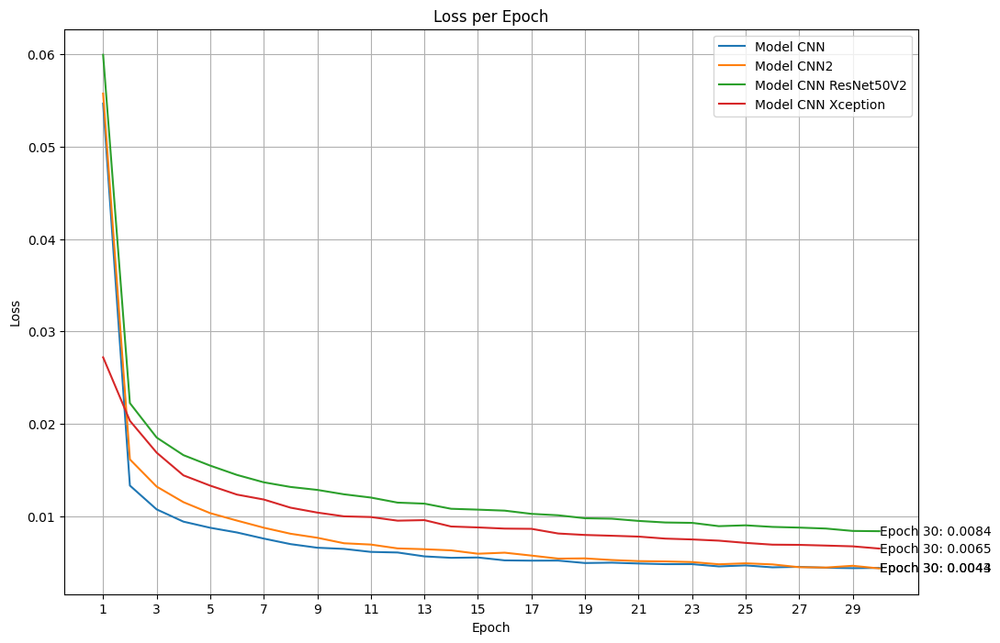

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Loss values for ModelCNN
epochs_cnn = np.arange(1, 31)
loss_cnn = np.array([0.054657839238643646, 0.013312182389199734, 0.010730649344623089, 0.009406909346580505,
                     0.008743326179683208, 0.008233422413468361, 0.007573838345706463, 0.006974380929023027,
                     0.006583601702004671, 0.006456216797232628, 0.006132038310170174, 0.006067350041121244,
                     0.00564747815951705, 0.005491381045430899, 0.005526332184672356, 0.005214941222220659,
                     0.00518396170809865, 0.005191282834857702, 0.004927634261548519, 0.004966649226844311,
                     0.00487486133351922, 0.004806486424058676, 0.004805710166692734, 0.004561173263937235,
                     0.0046701133251190186, 0.004461691249161959, 0.004514346830546856, 0.004416479729115963,
                     0.004372273571789265, 0.0044002956710755825])

# Loss values for ModelCNN2
epochs_cnn2 = np.arange(1, 31)
loss_cnn2 = np.array([0.055735450237989426, 0.016144469380378723, 0.013199971057474613, 0.011514668352901936,
                      0.010324916802346706, 0.009520306251943111, 0.008751828223466873, 0.008097593672573566,
                      0.007662811316549778, 0.007066032849252224, 0.006926056928932667, 0.006509892642498016,
                      0.006423815619200468, 0.006298273801803589, 0.005934220273047686, 0.0060469903983175755,
                      0.005733993370085955, 0.005405098665505648, 0.005430823657661676, 0.0052536544390022755,
                      0.00513605959713459, 0.005101545248180628, 0.0050337654538452625, 0.004792908672243357,
                      0.004897935315966606, 0.004779900889843702, 0.004476160276681185, 0.004441003780812025,
                      0.004628083202987909, 0.004340651445090771])

# Loss values for ModelCNNResNet50V2
epochs_resnet50v2 = np.arange(1, 31)
loss_resnet50v2 = np.array([0.059934284538030624, 0.02223433554172516, 0.01850697584450245, 0.01660393737256527,
                            0.015469808131456375, 0.01446225494146347, 0.0136648528277874, 0.013160151429474354,
                            0.012841498479247093, 0.01236469391733408, 0.012013369239866734, 0.011465543881058693,
                            0.01135603804141283, 0.010798445902764797, 0.010705213993787766, 0.010596752166748047,
                            0.010248850099742413, 0.010094820521771908, 0.00977475754916668, 0.009725917130708694,
                            0.009484834969043732, 0.00931514147669077, 0.009273525327444077, 0.008917182683944702,
                            0.009008876979351044, 0.008837333880364895, 0.008761987090110779, 0.00865961890667677,
                            0.00840019527822733, 0.008372831158339977])

# Loss values for ModelCNNXception
epochs_xception = np.arange(1, 31)
loss_xception = np.array([0.027192167937755585, 0.020321084186434746, 0.016871998086571693, 0.014416775666177273,
                          0.013303985819220543, 0.012333826161921024, 0.011801093816757202, 0.010918470099568367,
                          0.010387344285845757, 0.009978917427361012, 0.009906226769089699, 0.009511427953839302,
                          0.009570633992552757, 0.00887988694012165, 0.008781124837696552, 0.00865398533642292,
                          0.008628027513623238, 0.008122198283672333, 0.007965251803398132, 0.00787986908107996,
                          0.007787853013724089, 0.007570410147309303, 0.0074809095822274685, 0.007348379585891962,
                          0.007106848061084747, 0.006915307603776455, 0.006892911624163389, 0.006815925240516663,
                          0.006733335554599762, 0.006491736508905888])

# Plotting Loss
plt.figure(figsize=(12, 8))
plt.plot(epochs_cnn, loss_cnn, label='Model CNN')
plt.plot(epochs_cnn2, loss_cnn2, label='Model CNN2')
plt.plot(epochs_resnet50v2, loss_resnet50v2, label='Model CNN ResNet50V2')
plt.plot(epochs_xception, loss_xception, label='Model CNN Xception')

plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 31, 2))
plt.grid(True)

# Display latest epoch loss on the graph with index
plt.text(30, loss_cnn[-1], f'Epoch {epochs_cnn[-1]}: {loss_cnn[-1]:.4f}', ha='left', va='center')
plt.text(30, loss_cnn2[-1], f'Epoch {epochs_cnn2[-1]}: {loss_cnn2[-1]:.4f}', ha='left', va='center')
plt.text(30, loss_resnet50v2[-1], f'Epoch {epochs_resnet50v2[-1]}: {loss_resnet50v2[-1]:.4f}', ha='left', va='center')
plt.text(30, loss_xception[-1], f'Epoch {epochs_xception[-1]}: {loss_xception[-1]:.4f}', ha='left', va='center')

plt.show()


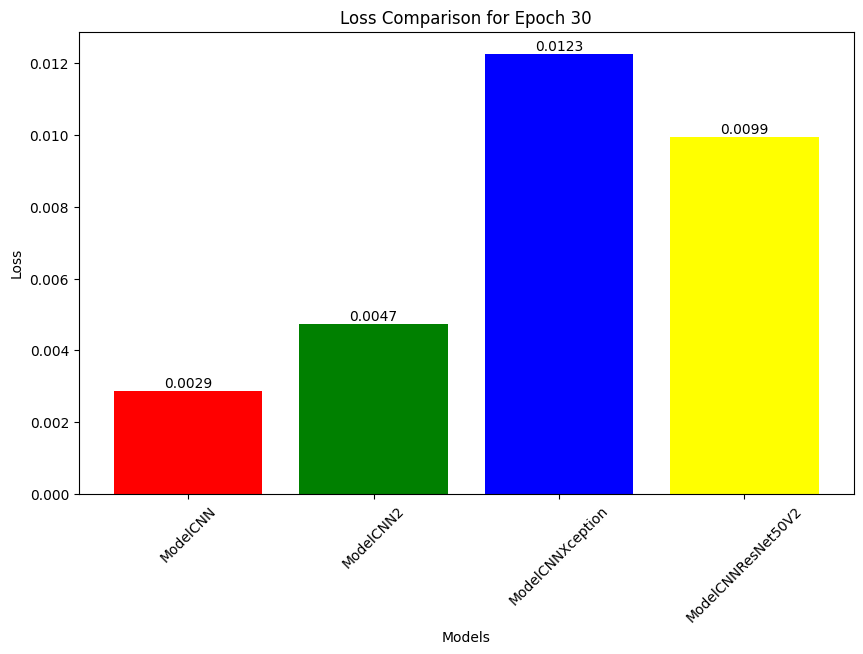

In [3]:
models = ['ModelCNN', 'ModelCNN2', 'ModelCNNXception', 'ModelCNNResNet50V2']
losses = [0.0028786456678062677, 0.004735217895358801, 0.012261619791388512, 0.009945670142769814]

plt.figure(figsize=(10, 6))  # Adjust the width and height as needed
bars = plt.bar(models, losses, color=['red', 'green', 'blue', 'yellow'])
plt.title('Loss Comparison for Epoch 30')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability

# Add loss values inside the bars
for bar, loss in zip(bars, losses):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.4f}', ha='center', va='bottom')

plt.show()

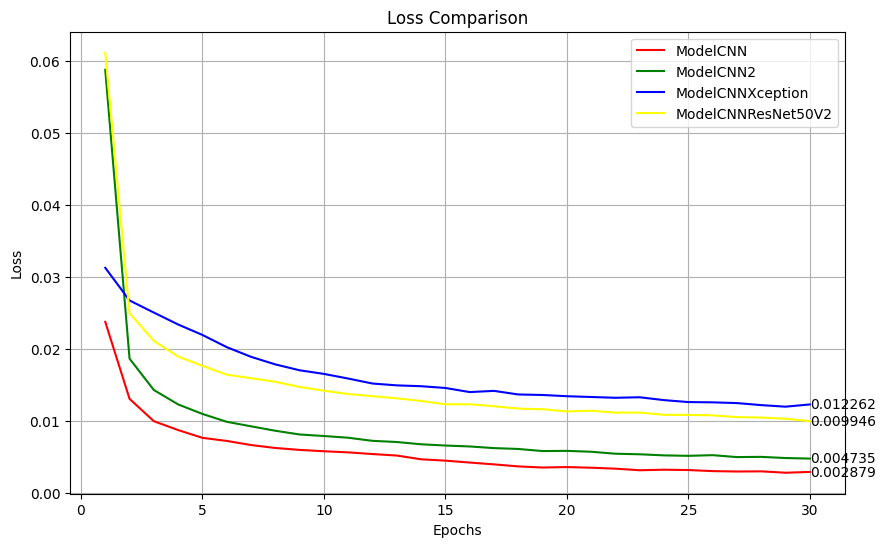

In [6]:
epochs = range(1, 31)

loss_ModelCNN = [0.023748978972434998, 0.013039876706898212, 0.009932640939950943, 0.008699352853000164, 0.0076185897924005985,
                 0.007190519943833351, 0.006619022693485022, 0.006208294071257114, 0.005941550713032484, 0.005754084791988134,
                 0.005599580705165863, 0.005364605691283941, 0.005156409926712513, 0.0046358900144696236, 0.004448889754712582,
                 0.004183195997029543, 0.003928028047084808, 0.00364856468513608, 0.003492342308163643, 0.003555185627192259,
                 0.003464742796495557, 0.0033315103501081467, 0.0031140304636210203, 0.0031887413933873177, 0.0031420066952705383,
                 0.0029943485278636217, 0.002935858443379402, 0.002961700549349189, 0.002769144717603922, 0.0028786456678062677]

loss_ModelCNN2 = [0.058782562613487244, 0.018629563972353935, 0.014269473031163216, 0.012264768593013287, 0.010942601598799229,
                  0.009850569069385529, 0.009220646694302559, 0.008605137467384338, 0.008085964247584343, 0.007873180322349072,
                  0.00763313751667738, 0.007201427593827248, 0.007038222625851631, 0.0067218211479485035, 0.00654960423707962,
                  0.006420052144676447, 0.006191348657011986, 0.006071502808481455, 0.005780030973255634, 0.005806393921375275,
                  0.005685536190867424, 0.005410402547568083, 0.005332854110747576, 0.005180614069104195, 0.0051173437386751175,
                  0.005211084149777889, 0.0049417889676988125, 0.0049736518412828445, 0.004810644779354334, 0.004735217895358801]

loss_ModelCNNXception = [0.03125832974910736, 0.02671922743320465, 0.025034481659531593, 0.023377612233161926, 0.02192343771457672,
                         0.02022833563387394, 0.01888280175626278, 0.01782901957631111, 0.017010537907481194, 0.01650635153055191,
                         0.015861470252275467, 0.015167892910540104, 0.0149129219353199, 0.014795997180044651, 0.014551477506756783,
                         0.013980671763420105, 0.014148003421723843, 0.013648053631186485, 0.013577202335000038, 0.013405888341367245,
                         0.013297002762556076, 0.013188427314162254, 0.013259011320769787, 0.012861048802733421, 0.01259357389062643,
                         0.01255400013178587, 0.012451103888452053, 0.012167674489319324, 0.011951420456171036, 0.012261619791388512]

loss_ModelCNNResNet50V2 = [0.06115998700261116, 0.024943964555859566, 0.02109283208847046, 0.018915141001343727, 0.01763204298913479,
                           0.016401562839746475, 0.01590925082564354, 0.015419885516166687, 0.014687699265778065, 0.014173531904816628,
                           0.013705763034522533, 0.0134098120033741, 0.013111176900565624, 0.012743791565299034, 0.012285791337490082,
                           0.012286847457289696, 0.012014077976346016, 0.011684484779834747, 0.011591573245823383, 0.011287985369563103,
                           0.011387867853045464, 0.011125914752483368, 0.011130561120808125, 0.010823399759829044, 0.010804485529661179,
                           0.010747326537966728, 0.010493985377252102, 0.010439644567668438, 0.010269209742546082, 0.009945670142769814]

# Plotting the loss values
plt.figure(figsize=(10, 6))

plt.plot(epochs, loss_ModelCNN, color='red', label='ModelCNN')
plt.plot(epochs, loss_ModelCNN2, color='green', label='ModelCNN2')
plt.plot(epochs, loss_ModelCNNXception, color='blue', label='ModelCNNXception')
plt.plot(epochs, loss_ModelCNNResNet50V2, color='yellow', label='ModelCNNResNet50V2')

# Adding loss values of the latest epoch as text annotations
plt.text(30, loss_ModelCNN[-1], f'{loss_ModelCNN[-1]:.6f}', ha='left', va='center')
plt.text(30, loss_ModelCNN2[-1], f'{loss_ModelCNN2[-1]:.6f}', ha='left', va='center')
plt.text(30, loss_ModelCNNXception[-1], f'{loss_ModelCNNXception[-1]:.6f}', ha='left', va='center')
plt.text(30, loss_ModelCNNResNet50V2[-1], f'{loss_ModelCNNResNet50V2[-1]:.6f}', ha='left', va='center')

plt.title('Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Frame Rate Analysis when Program is running

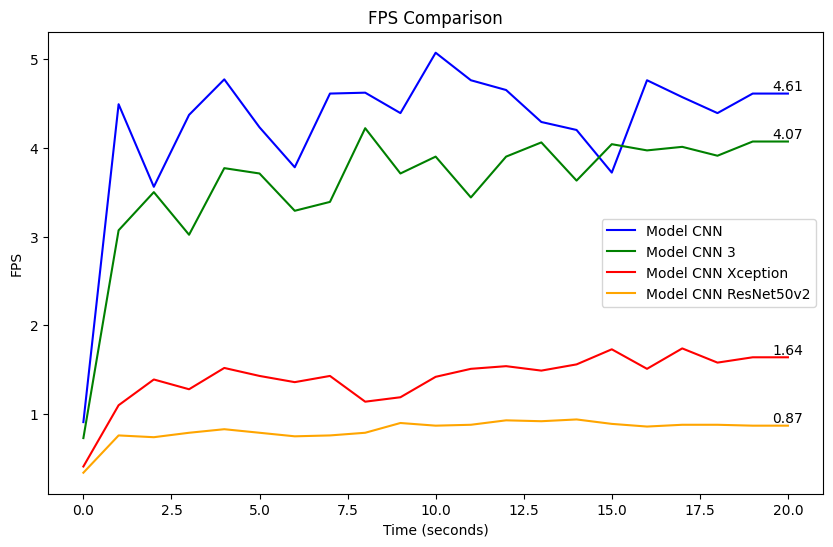

In [126]:
# Time values from 0 to 20 seconds
time = np.arange(0, 21, 1)

# FPS values for each model
fps_model_cnn = [
    0.91, 4.49, 3.56, 4.37, 4.77, 4.23, 3.78, 4.61, 4.62, 4.39,
    5.07, 4.76, 4.65, 4.29, 4.20, 3.72, 4.76, 4.57, 4.39, 4.61, 4.61
]

fps_model_cnn_3 = [
    0.73, 3.07, 3.50, 3.02, 3.77, 3.71, 3.29, 3.39, 4.22, 3.71,
    3.90, 3.44, 3.90, 4.06, 3.63, 4.04, 3.97, 4.01, 3.91, 4.07, 4.07
]

fps_model_cnn_xception = [
    0.41, 1.10, 1.39, 1.28, 1.52, 1.43, 1.36, 1.43, 1.14, 1.19,
    1.42, 1.51, 1.54, 1.49, 1.56, 1.73, 1.51, 1.74, 1.58, 1.64, 1.64
]

fps_model_cnn_resnet50v2 = [
    0.34, 0.76, 0.74, 0.79, 0.83, 0.79, 0.75, 0.76, 0.79, 0.90,
    0.87, 0.88, 0.93, 0.92, 0.94, 0.89, 0.86, 0.88, 0.88, 0.87, 0.87
]

# Plotting the data
plt.plot(time, fps_model_cnn, color='blue', label='Model CNN')
plt.plot(time, fps_model_cnn_3, color='green', label='Model CNN 3')
plt.plot(time, fps_model_cnn_xception, color='red', label='Model CNN Xception')
plt.plot(time, fps_model_cnn_resnet50v2, color='orange', label='Model CNN ResNet50v2')

# Display FPS value at the 20th second
plt.text(20, fps_model_cnn[-1], str(fps_model_cnn[-1]), ha='center', va='bottom')
plt.text(20, fps_model_cnn_3[-1], str(fps_model_cnn_3[-1]), ha='center', va='bottom')
plt.text(20, fps_model_cnn_xception[-1], str(fps_model_cnn_xception[-1]), ha='center', va='bottom')
plt.text(20, fps_model_cnn_resnet50v2[-1], str(fps_model_cnn_resnet50v2[-1]), ha='center', va='bottom')

# Title and labels
plt.title('FPS Comparison')
plt.xlabel('Time (seconds)')
plt.ylabel('FPS')

# Legend
plt.legend()

# Show the plot with enlarged figure size
plt.gcf().set_size_inches(10, 6)
plt.show()

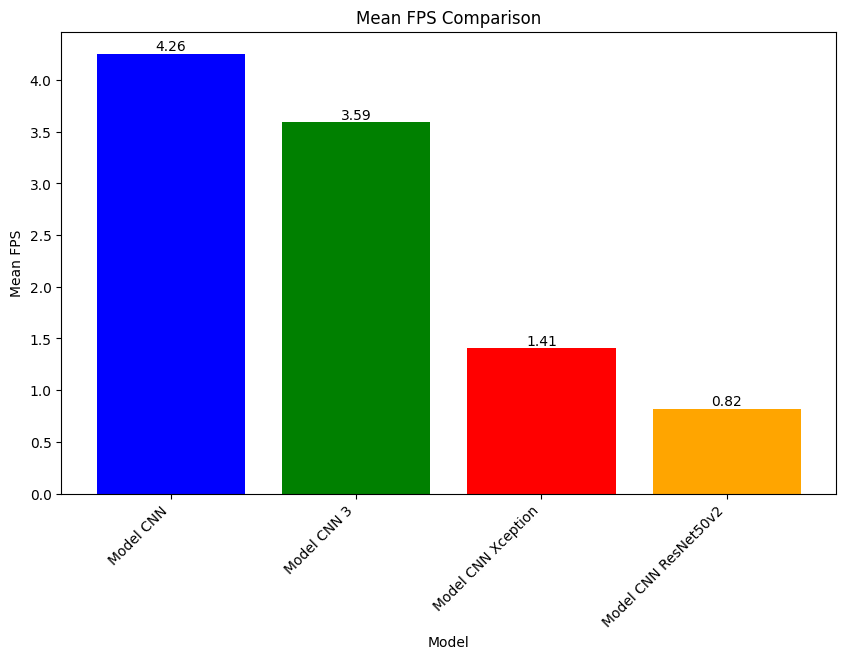

In [128]:

# FPS values for each model
fps_model_cnn = [
    0.91, 4.49, 3.56, 4.37, 4.77, 4.23, 3.78, 4.61, 4.62, 4.39,
    5.07, 4.76, 4.65, 4.29, 4.20, 3.72, 4.76, 4.57, 4.39, 4.61, 4.61
]

fps_model_cnn_3 = [
    0.73, 3.07, 3.50, 3.02, 3.77, 3.71, 3.29, 3.39, 4.22, 3.71,
    3.90, 3.44, 3.90, 4.06, 3.63, 4.04, 3.97, 4.01, 3.91, 4.07, 4.07
]

fps_model_cnn_xception = [
    0.41, 1.10, 1.39, 1.28, 1.52, 1.43, 1.36, 1.43, 1.14, 1.19,
    1.42, 1.51, 1.54, 1.49, 1.56, 1.73, 1.51, 1.74, 1.58, 1.64, 1.64
]

fps_model_cnn_resnet50v2 = [
    0.34, 0.76, 0.74, 0.79, 0.83, 0.79, 0.75, 0.76, 0.79, 0.90,
    0.87, 0.88, 0.93, 0.92, 0.94, 0.89, 0.86, 0.88, 0.88, 0.87, 0.87
]

# Calculate mean FPS for each model
mean_fps_model_cnn = np.mean(fps_model_cnn)
mean_fps_model_cnn_3 = np.mean(fps_model_cnn_3)
mean_fps_model_cnn_xception = np.mean(fps_model_cnn_xception)
mean_fps_model_cnn_resnet50v2 = np.mean(fps_model_cnn_resnet50v2)

# Models
models = ['Model CNN', 'Model CNN 3', 'Model CNN Xception', 'Model CNN ResNet50v2']

# Mean FPS values
mean_fps_values = [mean_fps_model_cnn, mean_fps_model_cnn_3, mean_fps_model_cnn_xception, mean_fps_model_cnn_resnet50v2]

# Colors for each model
colors = ['blue', 'green', 'red', 'orange']

# Plotting the bar chart
plt.bar(models, mean_fps_values, color=colors)

# Add mean FPS value as text on top of each bar
for i in range(len(models)):
    plt.text(i, mean_fps_values[i], round(mean_fps_values[i], 2), ha='center', va='bottom')

# Title and labels
plt.title('Mean FPS Comparison')
plt.xlabel('Model')
plt.ylabel('Mean FPS')

# Rotate the x-axis labels diagonally
plt.xticks(rotation=45, ha='right')

# Enlarge the figure size
plt.gcf().set_size_inches(10, 6)

# Show the plot
plt.show()

## Perhitungan Confusion Matrix

In [40]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN_BARU_Update.h5")

# Assuming you have the predicted labels and true labels for test data
X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate accuracy
accuracy = np.trace(cm) / np.sum(cm)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

# Print accuracy
print("Accuracy: {:.4f}".format(accuracy))

# Print the precision, recall, and F1-score table
print("Class\t\tPrecision\t1-Precision\tRecall\t\t1-Recall\tF1-score")
for i in range(len(LabelKelas)):
    print("{}\t\t{:.4f}\t\t{:.4f}\t\t{:.4f}\t\t{:.4f}\t\t{:.4f}".format(LabelKelas[i], precisions[i], 1-precisions[i],
                                                                         recalls[i], 1-recalls[i], f1_scores[i]))

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

KeyboardInterrupt: 

In [38]:
import string


#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN_BARU_Update.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

KeyboardInterrupt: 

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

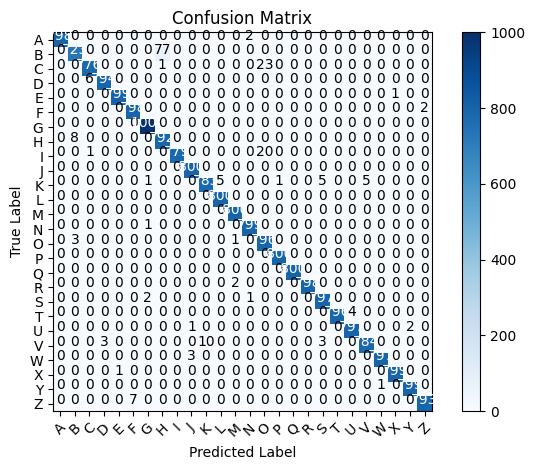

In [34]:
#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN3_baru.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

## Perhitungan Lama secara Waktu Training dari Model

In [43]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
import time

# Define the directory paths for the training and validation data
DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"

# Define the label classes
LabelKelas = ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z")

# Load the training and validation data
X_train, y_train = LoadCitraTraining(DirektoriDataSet, LabelKelas)
X_val, y_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)

# Normalize the image data and convert labels to categorical format
X_train = X_train / 255.0
X_val = X_val / 255.0
y_train = to_categorical(y_train, num_classes=len(LabelKelas))
y_val = to_categorical(y_val, num_classes=len(LabelKelas))

# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN_BARU_Update.h5")

# Define the TensorBoard callback to track training time per epoch
log_dir = "Logs"
tb_callback = TensorBoard(log_dir=log_dir)

# Predict once to warm up GPU
_ = model.predict(X_train[:1])

# Manually track training time per epoch
for epoch in range(30):
    start_time = time.time()
    tb_callback.on_epoch_begin(epoch)
    _ = model.predict(X_train)
    tb_callback.on_epoch_end(epoch)
    epoch_time = time.time() - start_time
    print(f"Epoch {epoch + 1} - Training Time: {epoch_time} seconds")




2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

In [45]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
import time

# Define the directory paths for the training and validation data
DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"

# Define the label classes
LabelKelas = ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z")

# Load the training and validation data
X_train, y_train = LoadCitraTraining(DirektoriDataSet, LabelKelas)
X_val, y_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)

# Normalize the image data and convert labels to categorical format
X_train = X_train / 255.0
X_val = X_val / 255.0
y_train = to_categorical(y_train, num_classes=len(LabelKelas))
y_val = to_categorical(y_val, num_classes=len(LabelKelas))

# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN2_BARU_Update.h5")

# Define the TensorBoard callback to track training time per epoch
log_dir = "Logs"
tb_callback = TensorBoard(log_dir=log_dir)

# Predict once to warm up GPU
_ = model.predict(X_train[:1])

# Manually track training time per epoch
for epoch in range(30):
    start_time = time.time()
    tb_callback.on_epoch_begin(epoch)
    _ = model.predict(X_train)
    tb_callback.on_epoch_end(epoch)
    epoch_time = time.time() - start_time
    print(f"Epoch {epoch + 1} - Training Time: {epoch_time} seconds")


2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

In [46]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
import time

# Define the directory paths for the training and validation data
DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"

# Define the label classes
LabelKelas = ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z")

# Load the training and validation data
X_train, y_train = LoadCitraTraining(DirektoriDataSet, LabelKelas)
X_val, y_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)

# Normalize the image data and convert labels to categorical format
X_train = X_train / 255.0
X_val = X_val / 255.0
y_train = to_categorical(y_train, num_classes=len(LabelKelas))
y_val = to_categorical(y_val, num_classes=len(LabelKelas))

# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNNXception_BARU_Update.h5")

# Define the TensorBoard callback to track training time per epoch
log_dir = "Logs"
tb_callback = TensorBoard(log_dir=log_dir)

# Predict once to warm up GPU
_ = model.predict(X_train[:1])

# Manually track training time per epoch
for epoch in range(30):
    start_time = time.time()
    tb_callback.on_epoch_begin(epoch)
    _ = model.predict(X_train)
    tb_callback.on_epoch_end(epoch)
    epoch_time = time.time() - start_time
    print(f"Epoch {epoch + 1} - Training Time: {epoch_time} seconds")

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

In [36]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
import time

# Define the directory paths for the training and validation data
DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"

# Define the label classes
LabelKelas = ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z")

# Load the training and validation data
X_train, y_train = LoadCitraTraining(DirektoriDataSet, LabelKelas)
X_val, y_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)

# Normalize the image data and convert labels to categorical format
X_train = X_train / 255.0
X_val = X_val / 255.0
y_train = to_categorical(y_train, num_classes=len(LabelKelas))
y_val = to_categorical(y_val, num_classes=len(LabelKelas))

# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNNResNet50V2_BARU_Update.h5")

# Define the TensorBoard callback to track training time per epoch
log_dir = "Logs"
tb_callback = TensorBoard(log_dir=log_dir)

# Predict once to warm up GPU
_ = model.predict(X_train[:1])

# Manually track training time per epoch
for epoch in range(30):
    start_time = time.time()
    tb_callback.on_epoch_begin(epoch)
    _ = model.predict(X_train)
    tb_callback.on_epoch_end(epoch)
    epoch_time = time.time() - start_time
    print(f"Epoch {epoch + 1} - Training Time: {epoch_time} seconds")

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

In [37]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
import time

# Define the directory paths for the training and validation data
DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"

# Define the label classes
LabelKelas = ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z")

# Load the training and validation data
X_train, y_train = LoadCitraTraining(DirektoriDataSet, LabelKelas)
X_val, y_val = LoadCitraTraining(DirektoriValidasi, LabelKelas)

# Normalize the image data and convert labels to categorical format
X_train = X_train / 255.0
X_val = X_val / 255.0
y_train = to_categorical(y_train, num_classes=len(LabelKelas))
y_val = to_categorical(y_val, num_classes=len(LabelKelas))

# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNNResNet50_BARU_Update.h5")

# Define the TensorBoard callback to track training time per epoch
log_dir = "Logs"
tb_callback = TensorBoard(log_dir=log_dir)

# Predict once to warm up GPU
_ = model.predict(X_train[:1])

# Manually track training time per epoch
for epoch in range(30):
    start_time = time.time()
    tb_callback.on_epoch_begin(epoch)
    _ = model.predict(X_train)
    tb_callback.on_epoch_end(epoch)
    epoch_time = time.time() - start_time
    print(f"Epoch {epoch + 1} - Training Time: {epoch_time} seconds")

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

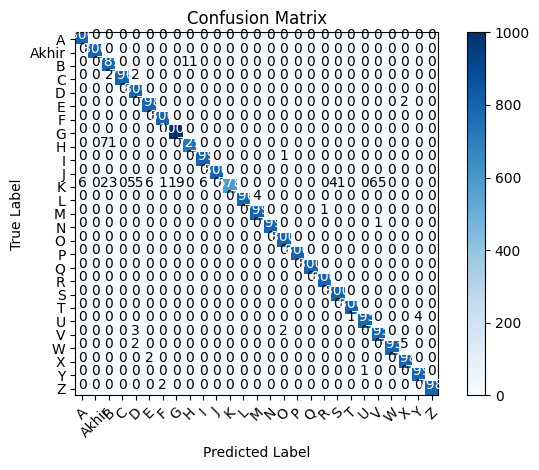

In [41]:
import pandas as pd
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows

#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN_BARU_Update.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

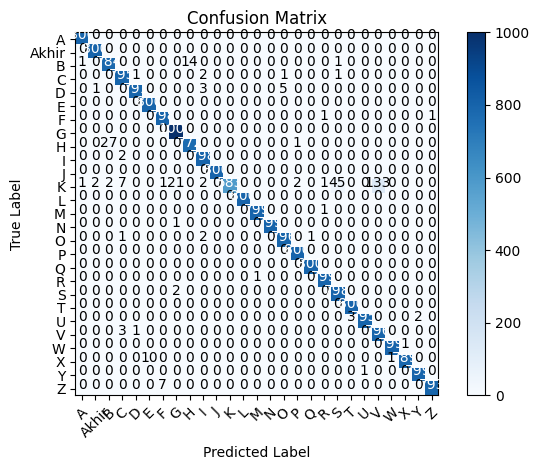

In [35]:
import pandas as pd
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows

#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNN2_BARU_Update.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

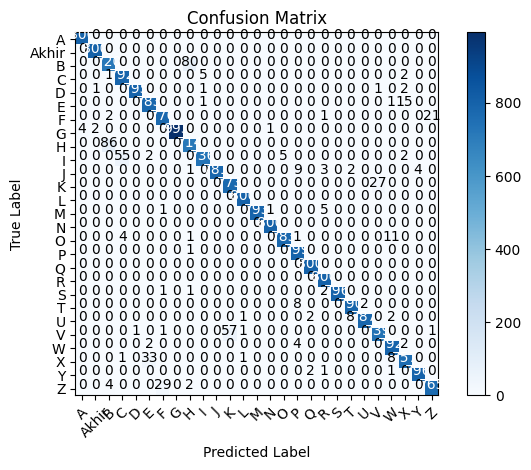

In [36]:
import pandas as pd
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows

#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNNResNet50V2_BARU_Update.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

2023-04-02-175236389535.jpg
2023-04-02-175236595622.jpg
2023-04-02-175236853629.jpg
2023-04-02-175237058567.jpg
2023-04-02-175237331973.jpg
2023-04-02-175237588145.jpg
2023-04-02-175237794379.jpg
2023-04-02-175238053019.jpg
2023-04-02-175238262075.jpg
2023-04-02-175238515080.jpg
2023-04-02-175238723002.jpg
2023-04-02-175238998208.jpg
2023-04-02-175239252149.jpg
2023-04-02-175239459542.jpg
2023-04-02-175239717633.jpg
2023-04-02-175239923543.jpg
2023-04-02-175240181534.jpg
2023-04-02-175240386668.jpg
2023-04-02-175240665477.jpg
2023-04-02-175240918016.jpg
2023-04-02-175241121531.jpg
2023-04-02-175241378735.jpg
2023-04-02-175241587077.jpg
2023-04-02-175241843050.jpg
2023-04-02-175242051042.jpg
2023-04-02-175242323572.jpg
2023-04-02-175242580159.jpg
2023-04-02-175242787038.jpg
2023-04-02-175243044695.jpg
2023-04-02-175243252013.jpg
2023-04-02-175243510072.jpg
2023-04-02-175243716984.jpg
2023-04-02-175243991522.jpg
2023-04-02-175244242331.jpg
2023-04-02-175244450112.jpg
2023-04-02-175244706

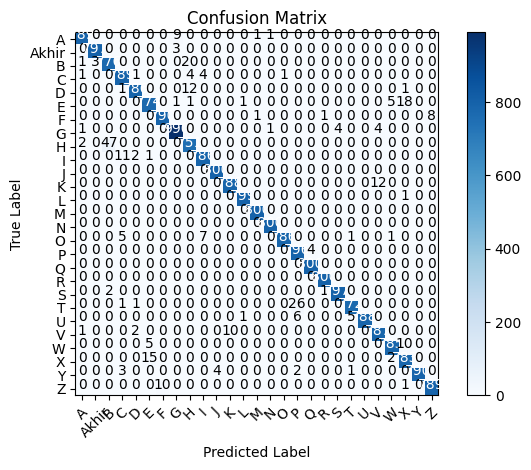

In [37]:
import pandas as pd
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows

#Training Data Set

DirektoriDataSet = "D:\\temp\\training_baru2"
DirektoriValidasi = "D:\\temp\\validasi_baru2"
#   Data Set disimpan dalam direktori yang sama dengan nama kelas

#b. Label Data Set
LabelKelas=("A","Akhir","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z") 

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)


# Load the model with weights from the pre-existing file
model = tf.keras.models.load_model("weight_CNNXception_BARU_Update.h5")

X_test, D_test = LoadCitraTraining(DirektoriDataSet, LabelKelas)

predicted_labels = model.predict(X_test)
predicted_labels = np.argmax(predicted_labels, axis=1)

true_labels = np.argmax(D_test, axis=1)

cm = confusion_matrix(true_labels, predicted_labels)

# Calculate percentages for the side bar
cm_percent = cm.astype('float') / np.sum(cm)

# Calculate precision for each class
precisions = precision_score(true_labels, predicted_labels, average=None)

# Calculate recall for each class
recalls = recall_score(true_labels, predicted_labels, average=None)

# Calculate F1-score for each class
f1_scores = f1_score(true_labels, predicted_labels, average=None)

# Calculate accuracy for each class
accuracies = np.diag(cm) / np.sum(cm, axis=1)

# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, index=LabelKelas, columns=LabelKelas)

# Print the confusion matrix table
print("Confusion Matrix:")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(cm_df)

# Create a DataFrame for precision, 1-precision, recall, 1-recall, and F1-score
metrics_df = pd.DataFrame({
    'Precision': precisions,
    '1-Precision': 1 - precisions,
    'Recall': recalls,
    '1-Recall': 1 - recalls,
    'F1-score': f1_scores,
    'Accuracy': accuracies
}, index=LabelKelas)

# Print the precision, 1-precision, recall, 1-recall, and F1-score table
print("\nMetrics:")
print(metrics_df)

# Plot the confusion matrix with percentages for the side bar
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()  # Display percentages in the color bar with 2 decimal places
tick_marks = np.arange(len(LabelKelas))
plt.xticks(tick_marks, LabelKelas, rotation=45)
plt.yticks(tick_marks, LabelKelas)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()